**MNE python library**

<img width='800' align="center" src='https://mne.tools/stable/_images/mne_logo.svg'>

<br>
<br>

> MNE-Python is a powerful open-source Python library used for processing, analyzing, and visualizing neurophysiological data such as EEG, MEG, and other similar signals. One of its key strengths is its ability to import a wide variety of EEG data formats, making it a versatile tool for researchers working with different systems and devices.


In [ ]:
!pip install mne
# install below libraries if you needed them
# !pip install mne-qt-browser PyQt5

In [ ]:
!wget https://figshare.com/ndownloader/files/11821322
!mv /content/11821322 /content/a.mat

In [31]:
import mne
import matplotlib.pyplot as plt
from scipy.io import loadmat
from mne import create_info
from mne.io import RawArray


# Load data from .mat file
mat = loadmat('/content/a.mat')

# Check the available keys (variables) inside the .mat file
print(mat.keys())

data = mat['EEG']['data'][0][0]  # Assuming the key for EEG data is 'data'

# If you got unusual plot you have to change data scalde and frequency
# Convert the data to volts by applying the appropriate scaling factor if the data is in microvolts:
data = data * 1e-6

# Create MNE info structure
sfreq = 500  # Sampling frequency they mentioned is 500Hz
ch_num = data.shape[0]


# For ICA you need to mention channel names
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6',
            'T7', 'C3', 'Cz', 'C4', 'T8', 'CP5', 'CP1', 'CP2', 'CP6', 'P7', 'P3',
            'Pz', 'P4', 'P8', 'POz', 'O1', 'Oz', 'O2', 'AFz', 'FCz', 'TP8', 'TP7']

ch_types = ['eeg'] * len(ch_names)

# Add montage (sensor positions)
# If you don't use this part later when you want to plot ICA you will get this error:
# No digitization points found.
montage = mne.channels.make_standard_montage('standard_1020')

info = create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)
info.set_montage(montage, on_missing='ignore')
raw = RawArray(data, info)

# Plot the data
# mne.viz.set_browser_backend('matplotlib')
# raw.plot(n_channels=ch_num)

dict_keys(['__header__', '__version__', '__globals__', 'EEG'])
Creating RawArray with float64 data, n_channels=33, n_times=1811360
    Range : 0 ... 1811359 =      0.000 ...  3622.718 secs
Ready.


## **How to Choose the Best Number of Components:**

1.	Maximizing Variance Explained:
    - PCA as Preprocessing: ICA uses Principal Component Analysis (PCA) to reduce dimensionality before estimating the independent components. You can use PCA to reduce the number of components while retaining the majority of the signal’s variance.
    - Cumulative Explained Variance: Before running ICA, you can run PCA on your data and inspect how much variance each component explains. You can choose n_components so that the selected components explain a sufficient proportion of the data variance (e.g., 95% or 99%).

    ```
        pca = PCA(n_components=64)  # Adjust the number of components
        pca.fit(data)
        explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
        plt.plot(explained_variance_ratio)
        plt.axhline(y=0.95, color='r', linestyle='--')  # Mark the 95% threshold
        plt.show()
    ```

2.	Balancing Performance:
    - Avoid Overfitting: If you estimate too many components, ICA may start picking up noise or overfit to your data. Estimating fewer components (e.g., 20-40) can help avoid this and make the computation faster.
	- Focus on Major Artifacts: Reducing the number of components focuses the decomposition on the most prominent features, including the main artifacts (e.g., eye movements, muscle artifacts).
3.	Empirical Testing:
	- Try Different Values: It’s common to experiment with different values of n_components (e.g., 20, 30, 40, etc.) and see how well the components match known artifacts. If you reduce the number of components too much, some useful signal may be missed, so try a range of values to find a good balance.
4.	Use Automatic Selection (n_components='auto'):
	- MNE-Python allows setting n_components='auto', which will estimate the number of components based on the rank of the data, especially if rank-deficient data (e.g., due to noise correction) is used.

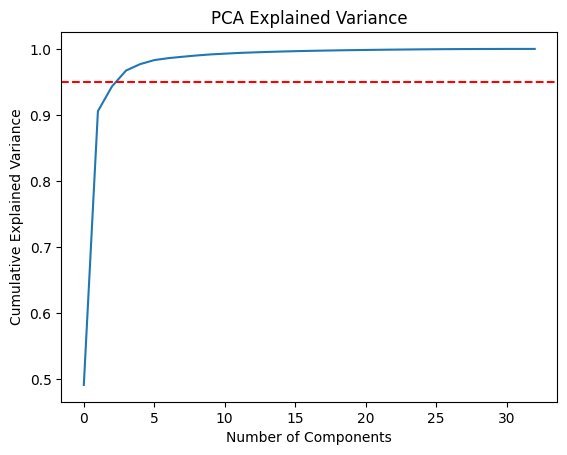

In [ ]:
from sklearn.decomposition import PCA
import numpy as np

pca = PCA(n_components=ch_num)  # Adjust the number of components
pca.fit(data)
explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
plt.plot(explained_variance_ratio)
plt.axhline(y=0.95, color='r', linestyle='--')  # Mark the 95% threshold
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.show()

## **ICA different algorithms**

<br><br>

|Algorithm | Focus | Key Advantage | Key Disadvantage|
|----------|-------|---------------|-----------------|
|FastICA | Maximize non-Gaussianity | Fast and efficient | Sensitive to initialization and noise|
|JADE | Diagonalize cumulant matrices | Robust for high-dimensional data |	Slower than FastICA
Infomax ICA | Maximize mutual information | Popular in EEG analysis | Assumes super-Gaussian distribution
Extended Infomax ICA | Handle super- and sub-Gaussian data | More flexible than Infomax ICA | Slower and more complex
Sparse ICA | Sparse source assumption | Works well with sparse data | Not suitable for non-sparse signals
Kernel ICA | Non-linear source separation | Handles non-linear mixing of signals | Computationally complex


### **MNE build-in function**

`mne.preprocessing.ICA()`

choose different algorithems:

`method = ‘fastica’ | ‘infomax’ | ‘picard’`

- The ICA method to use in the fit method. Use the `fit_params` argument to set additional parameters.
- Defaults to `fastica`
- if you want **Extended Infomax**, set `method='infomax'` and `fit_params=dict(extended=True)` (this also works for method='picard').

```python
mne.preprocessing.ICA('infomax', fit_params=dict(extended=True))
```

In [ ]:
# First we instantiate ICA
ica = mne.preprocessing.ICA(n_components=20, random_state=0, max_iter=800)

In [ ]:
# Then we fit them like scikit learn
# If you want to filter data between frequency use: raw.copy().filter(450, 550)
ica.fit(raw.copy())

Fitting ICA to data using 33 channels (please be patient, this may take a while)


<ipython-input-33-0e83876bf98d>:3: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw.copy())


Selecting by number: 20 components
Fitting ICA took 139.4s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=800
Fit,43 iterations on raw data (1811360 samples)
ICA components,20
Available PCA components,33
Channel types,eeg
ICA components marked for exclusion,—


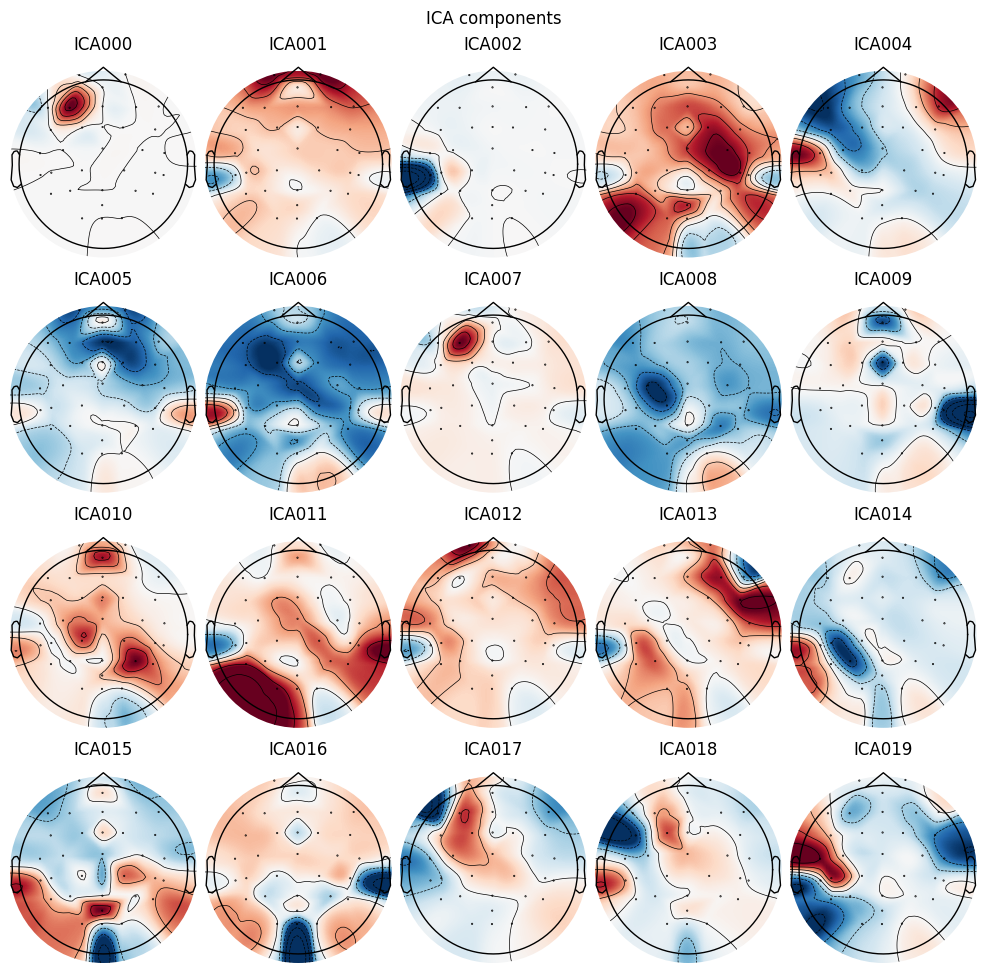

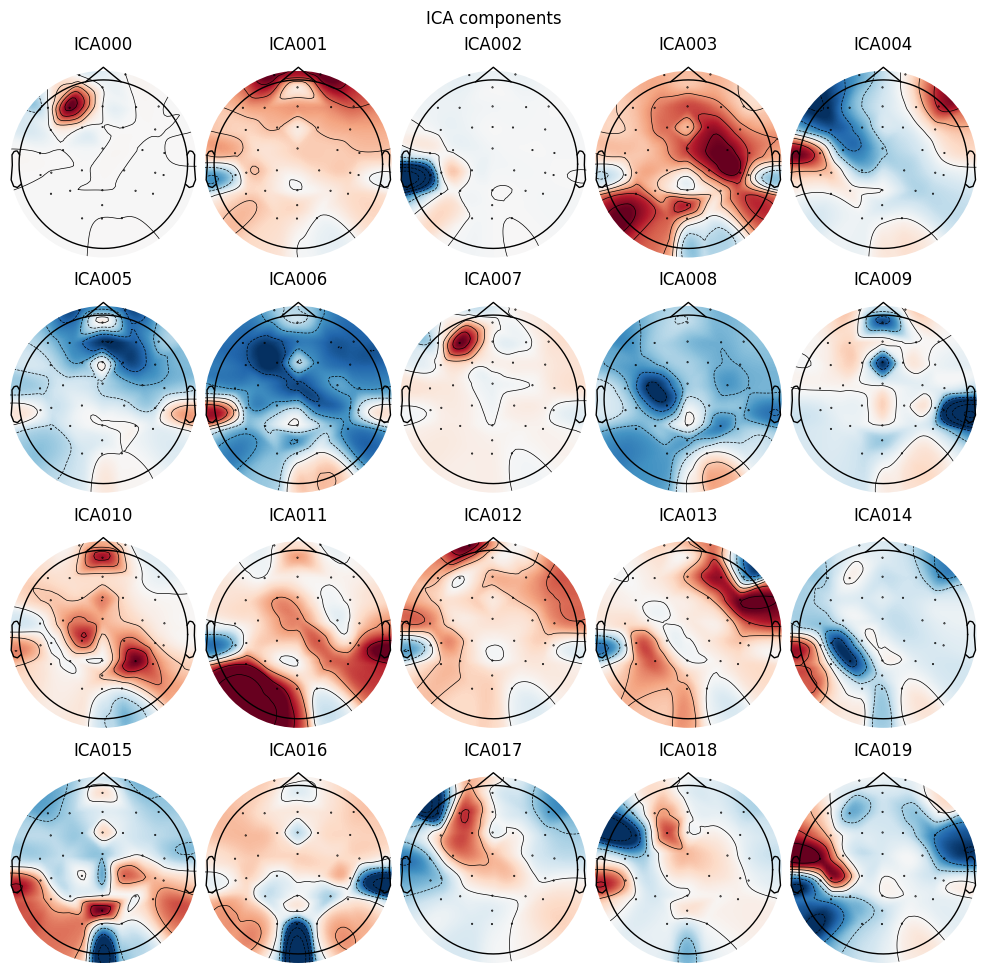

In [ ]:
ica.plot_components()

> **Identify Outliers using `ica.plot_scores()`:** Look for outliers or clusters of components that deviate significantly from the norm. Components that fall far from the main cluster or have unusually high scores in certain metrics might be artifacts.

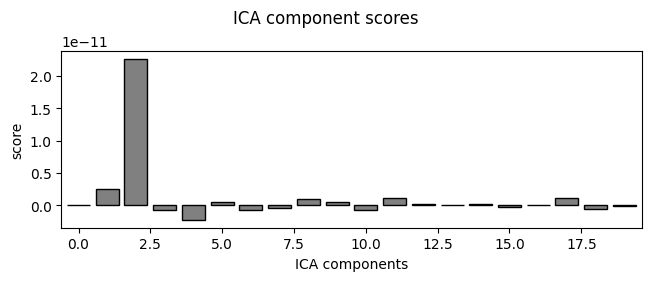

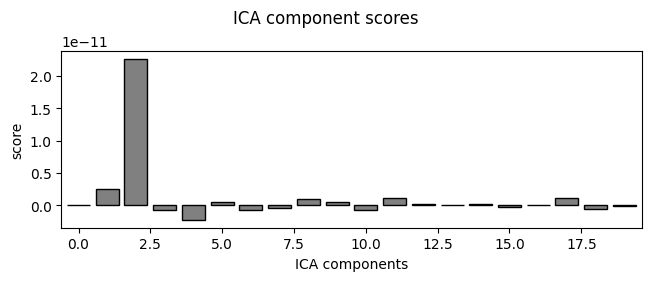

In [ ]:
scores = ica.get_sources(raw).get_data().mean(axis=1) # Calculate the mean score for each component across time.
ica.plot_scores(scores=scores)

> two reference electrodes (opposite lateral mastoids) was used. I assume that two last channels are refrences

In [ ]:
ica.exclude = [1, 2, 4, 10, 11, 17, 18]
bad_idx, scores = ica.find_bads_ecg(raw, ch_names[-4], threshold=2)

print('-' * 30)
print(bad_idx)

Using channel AFz to identify heart beats.
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 5000 samples (10.000 s)

Number of ECG events detected : 5604 (average pulse 92.81423902482113 / min.)
Not setting metadata
5604 matching events found
No baseline correction applied
Using data from preloaded Raw for 5604 events and 501 original time points ...
1 bad epochs dropped
------------------------------
[]


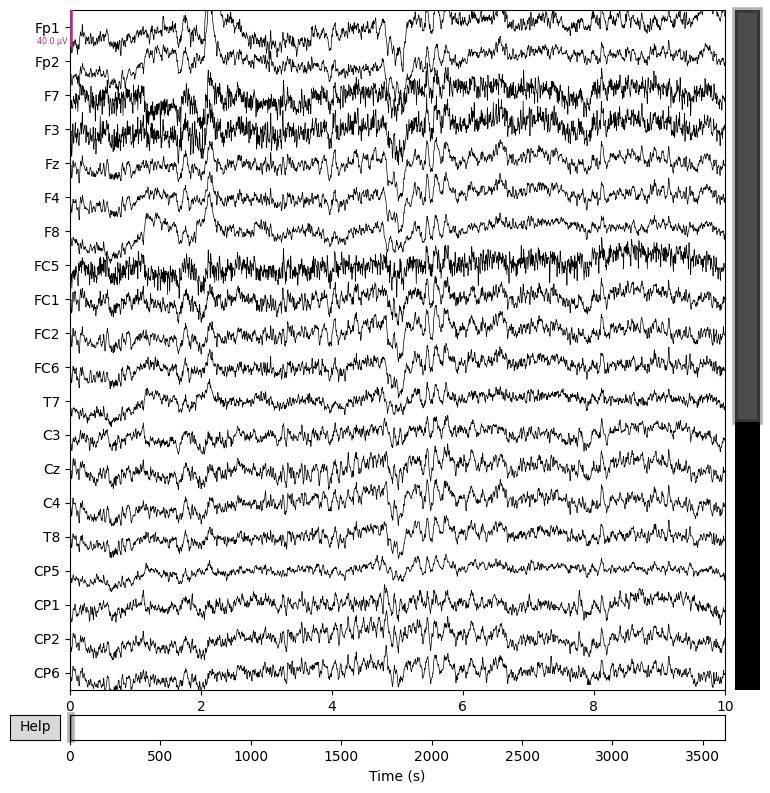

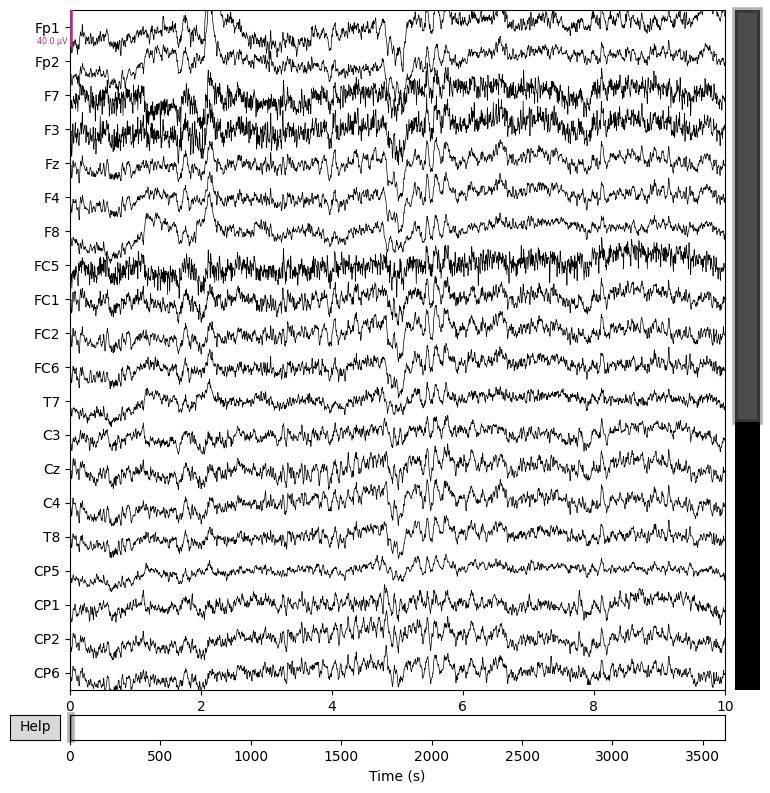

In [ ]:
raw.plot()

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 7 ICA components
    Projecting back using 33 PCA components


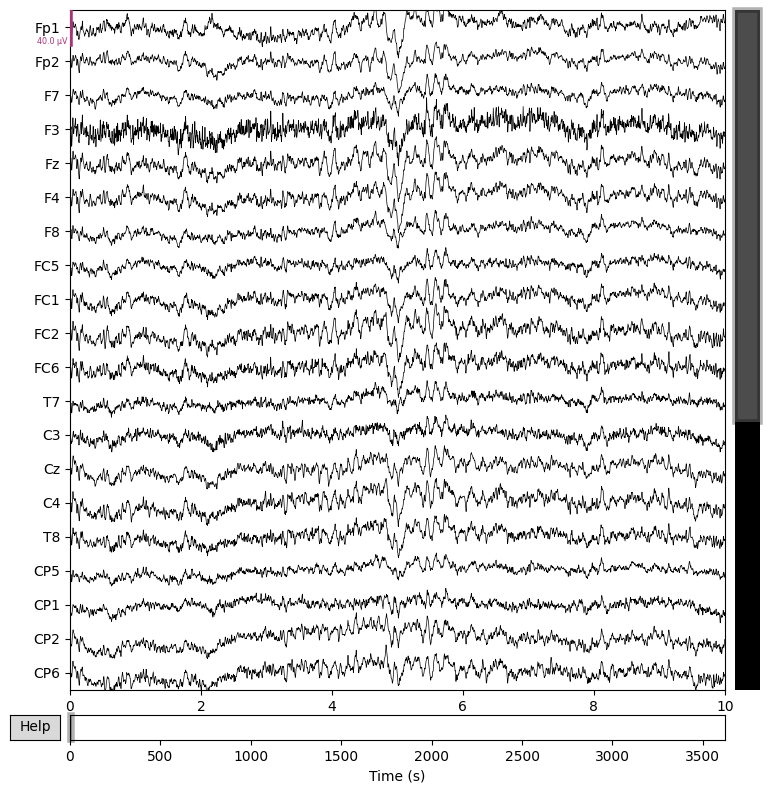

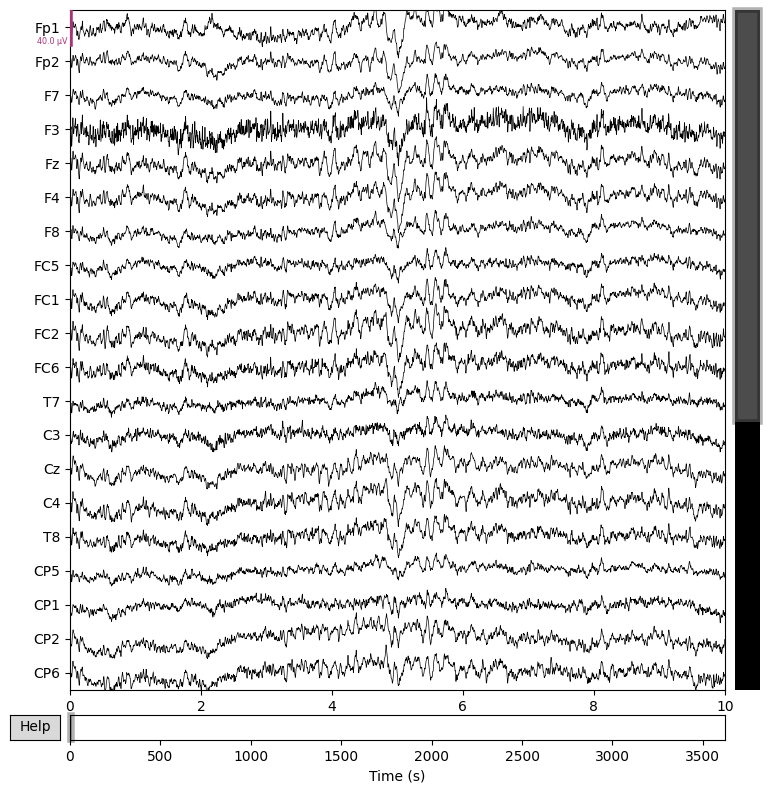

In [ ]:
ica.apply(raw.copy(), exclude=ica.exclude).plot()

### **1. FastICA**


FastICA is one of the most popular ICA algorithms due to its speed and simplicity. It aims to maximize non-Gaussianity using an approximation of negentropy, which is a measure of how non-Gaussian a signal is. The more non-Gaussian the independent components, the better the separation.
<br><br>
**Algorithm:**

- Step 1: Center the data by subtracting the mean.
- Step 2: Whiten the data (remove correlations between variables).
- Step 3: Maximize non-Gaussianity by finding a weight vector  $\mathbf{w}$  that maximizes the kurtosis (or some other measure of non-Gaussianity) of the transformed signal.

The key part of FastICA is the iterative optimization of the weight vector  $\mathbf{w}$ . The update rule is:

$$
\mathbf{w}_{\text{new}} = \mathbb{E}[\mathbf{x} g(\mathbf{w}^T \mathbf{x})] - \mathbb{E}[g{\prime}(\mathbf{w}^T \mathbf{x})] \mathbf{w}
$$

Where $g$ is a non-linearity (e.g., $g(u) = \tanh(u)$).
<br><br>

**Advantages:**

- Speed: FastICA is computationally efficient and fast, which is particularly useful for large datasets.
- Simple Implementation: The algorithm is relatively straightforward to implement.

**Disadvantages:**

- Convergence: Can converge to local minima and may require multiple runs with different initializations.
- Sensitive to Noise: Noise and outliers can affect the separation quality.


Creating RawArray with float64 data, n_channels=33, n_times=1811360
    Range : 0 ... 1811359 =      0.000 ...  3622.718 secs
Ready.
Fitting ICA to data using 33 channels (please be patient, this may take a while)


<ipython-input-29-4da5fc001441>:16: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 10 components
Fitting ICA took 54.2s.


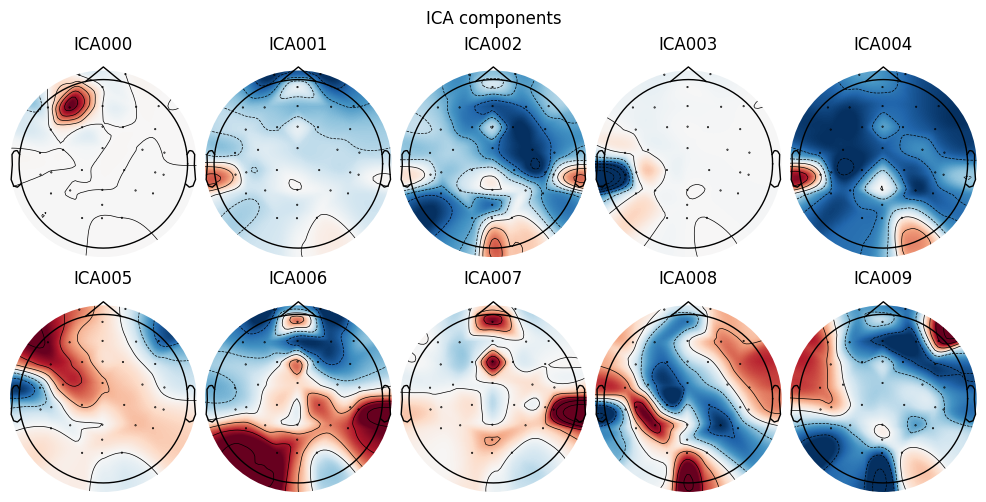

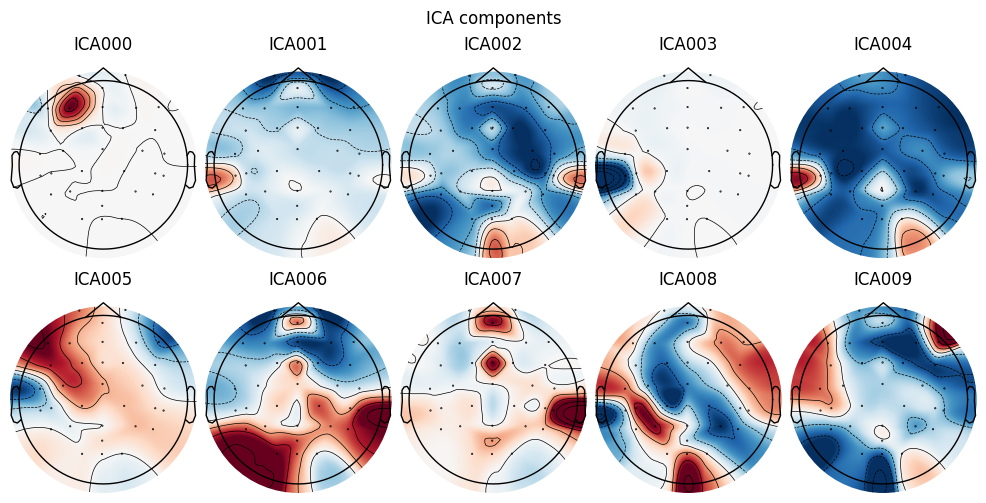

In [29]:
import numpy as np
from sklearn.decomposition import FastICA
import matplotlib.pyplot as plt

n_components = data.shape[0]

# FastICA Model
fastica = FastICA(n_components=n_components)
ica_components = fastica.fit_transform(data.T)

# Convert ICA components back to MNE object for plotting
ica_raw = mne.io.RawArray(ica_components.T, info)

# Plot ICA components as scalp topographies
ica = mne.preprocessing.ICA(n_components=10)
ica.fit(raw.copy())
ica.components_ = ica_components.T  # Manually set algorithm components

# Plot topomap of the ICA components
ica.plot_components(inst=ica_raw, show=True)

### **2. Infomax ICA**

Infomax ICA maximizes the mutual information between the observed data and the estimated sources. It is closely related to maximum likelihood estimation. This algorithm is particularly popular in EEG research and was originally developed to process neural signals.

Algorithm:

- Step 1: Model the sources using a logistic sigmoid function, which assumes that the sources are independent and have a super-Gaussian distribution.
- Step 2: Maximize the mutual information between the input data and the estimated sources by updating the weight matrix  $\mathbf{W}$.

The update rule for the weight matrix is:

$$
\Delta \mathbf{W} \propto \left[ \mathbf{I} + (1 - 2 \mathbf{y}) \mathbf{x}^T \right] \mathbf{W}
$$

Where  $\mathbf{y}$  is the estimated sources, $\mathbf{x}$  is the observed data, and  $\mathbf{W}$  is the weight matrix.
<br><br>

**Advantages:**

- Good for EEG: Infomax ICA is particularly effective for separating neural signals from artifacts like eye blinks or muscle movements.
- Well-established: It has been used successfully in a variety of signal processing applications.

**Disadvantages:**

- Non-linearity Assumption: The algorithm assumes that the sources have a specific (super-Gaussian) distribution, which may not always be the case.
- Slow Convergence: It may converge slower than FastICA.

Fitting ICA to data using 33 channels (please be patient, this may take a while)


<ipython-input-42-03ec18d8f6eb>:8: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw.copy())


Selecting by number: 10 components
Computing Infomax ICA
Fitting ICA took 186.8s.


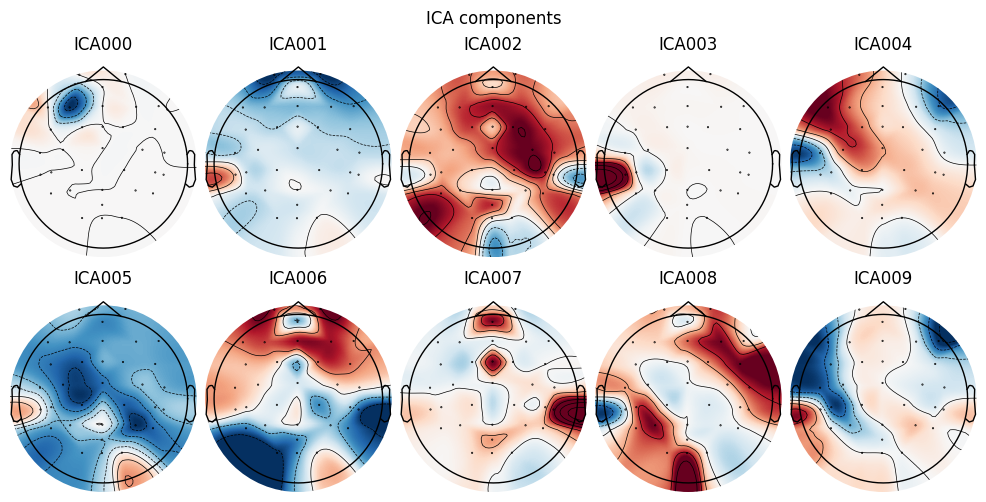

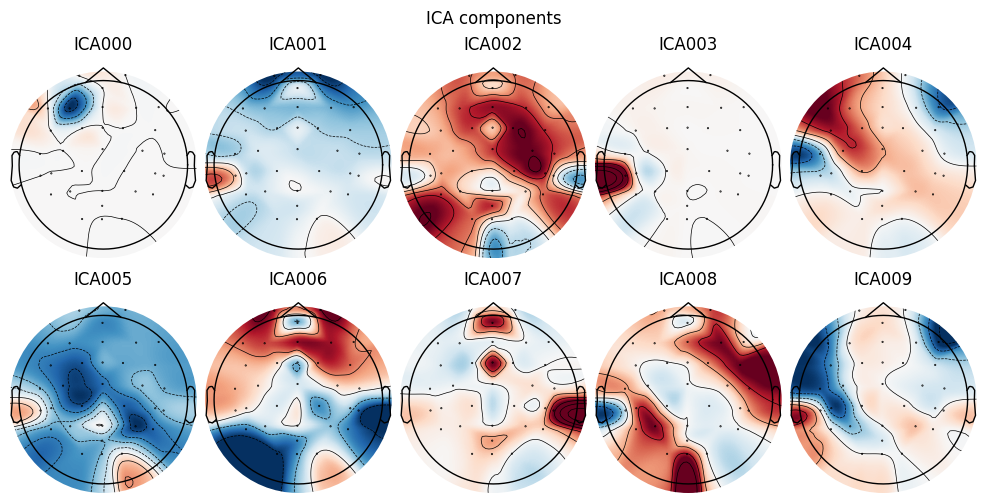

In [42]:
import mne
from mne.preprocessing import ICA
import numpy as np


# Run Infomax ICA
ica = ICA(n_components=10, method='infomax', random_state=97)
ica.fit(raw.copy())

# Plot components
ica.plot_components()

### **3. Sparse ICA**

Sparse ICA is based on the assumption that the source signals are sparse, meaning most of the time the signal values are close to zero, and only occasionally take large values. This is useful when the underlying signals are not only independent but also sparse.

Algorithm:

- Step 1: Center and whiten the data.
- Step 2: Apply a sparsity constraint, typically based on the $\ell_1$ -norm (sum of absolute values of the signal), to estimate the independent components.

Sparse ICA tries to minimize the following cost function:

$$
J(\mathbf{W}) = \sum_{i=1}^{n} \| \mathbf{W}_i^T \mathbf{x} \|_1
$$

where $\mathbf{W}_i$ is the i-th row of the unmixing matrix $\mathbf{W}$, and  $\mathbf{x}$ is the data.

<br><br>
**Advantages:**

- Effective for Sparse Data: Works well when the sources are sparse, such as when most values are close to zero.
- Robust to Noise: Sparse ICA can be more robust to noise than traditional ICA algorithms.

**Disadvantages:**

- Not Always Suitable: If the sources are not sparse, this algorithm may not work well.
- More Computationally Intensive: Imposing sparsity constraints adds to the computational load.

Creating RawArray with float64 data, n_channels=33, n_times=33
    Range : 0 ... 32 =      0.000 ...     0.064 secs
Ready.
Fitting ICA to data using 33 channels (please be patient, this may take a while)


<ipython-input-47-0479dea2f7b3>:15: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw.copy())


Selecting by number: 10 components
Fitting ICA took 65.7s.


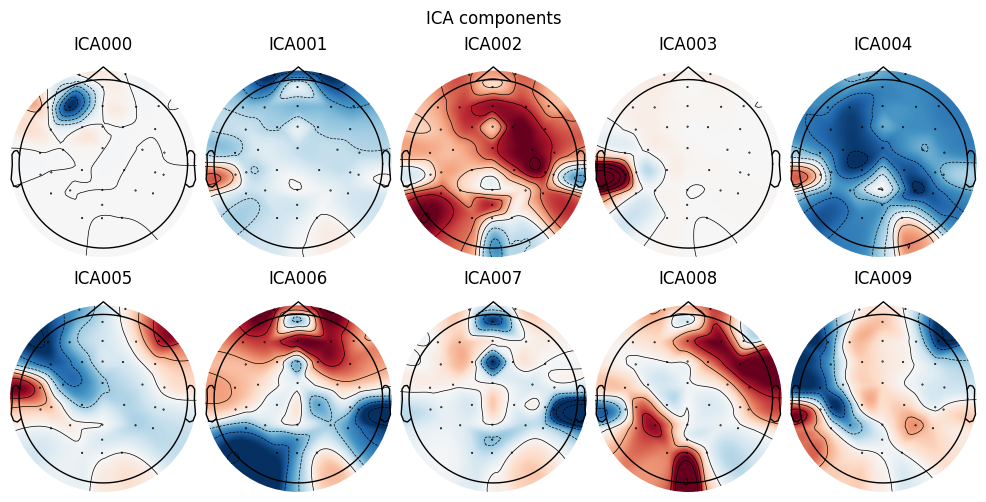

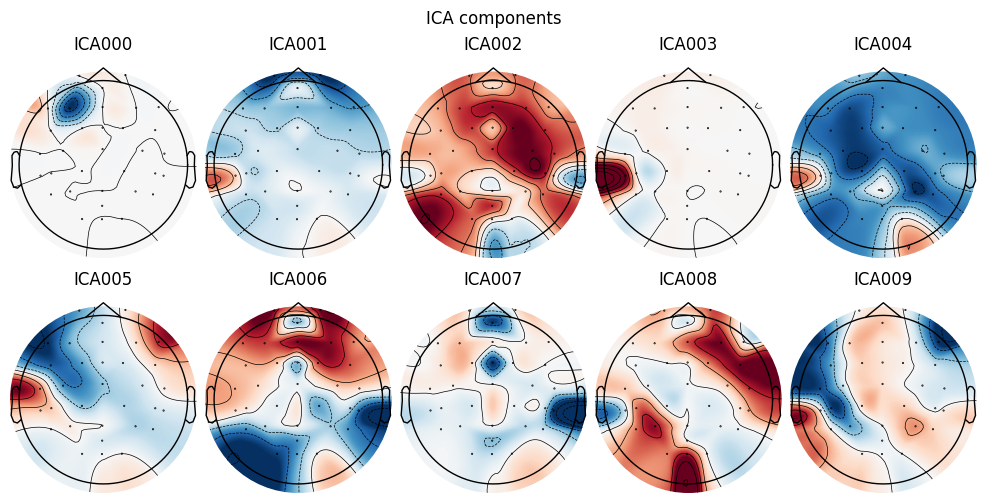

In [47]:
from sklearn.decomposition import SparsePCA

n_channels = data.shape[0]

# Sparse ICA Model
sparse_ica = SparsePCA(n_components=n_channels, random_state=0)
ica_components = sparse_ica.fit_transform(data.copy())


# Convert ICA components back to MNE object for plotting
ica_raw = mne.io.RawArray(ica_components.T, info)

# Plot ICA components as scalp topographies
ica = mne.preprocessing.ICA(n_components=10)
ica.fit(raw.copy())
ica.components_ = ica_components.T  # Manually set algorithm components

# Plot topomap of the ICA components
ica.plot_components(inst=ica_raw, show=True)

### **4. Kernel ICA**

Overview:

Kernel ICA is a non-linear version of ICA that uses kernel methods (common in machine learning) to estimate the independent components. Instead of assuming linear mixing of signals, Kernel ICA can handle non-linear relationships between the observed signals and the sources.
<br><br>

**Algorithm:**

- Step 1: Apply a kernel function to map the data to a higher-dimensional space.
- Step 2: Estimate the independent components by diagonalizing the kernelized covariance matrix.

Kernel ICA is based on the idea that the non-linear relationships between signals can be linearized in a high-dimensional space using kernel methods.
<br><br>

**Advantages:**

- Non-linear Relationships: Can separate non-linearly mixed sources, which is an advantage over standard ICA.
- Flexible: Applicable to a wide range of problems where the linear mixing assumption doesn’t hold.

**Disadvantages:**

- Complexity: Kernel ICA is more computationally complex and harder to implement.
- Choice of Kernel: Performance depends heavily on the choice of the kernel function.

Creating RawArray with float64 data, n_channels=33, n_times=33
    Range : 0 ... 32 =      0.000 ...     0.064 secs
Ready.
Fitting ICA to data using 33 channels (please be patient, this may take a while)


<ipython-input-48-7ea7411d38e4>:15: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw.copy())


Selecting by number: 10 components
Fitting ICA took 57.0s.


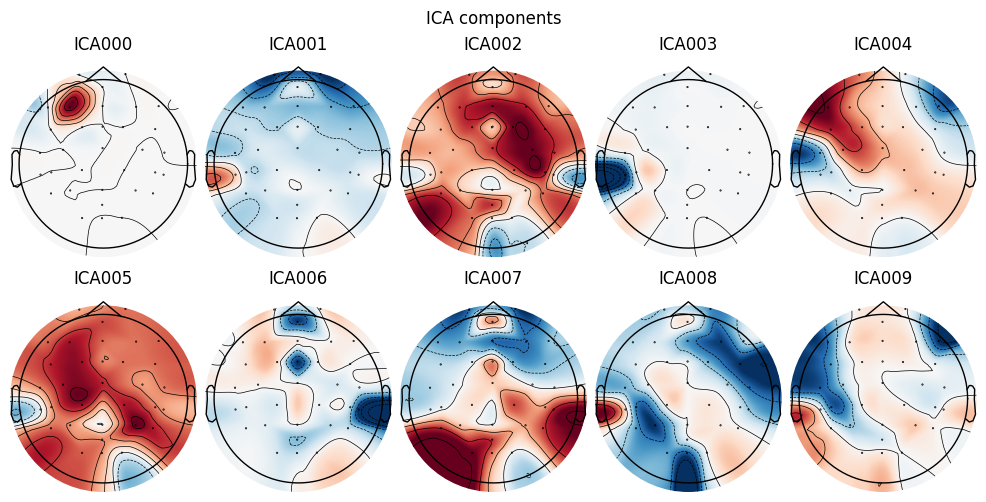

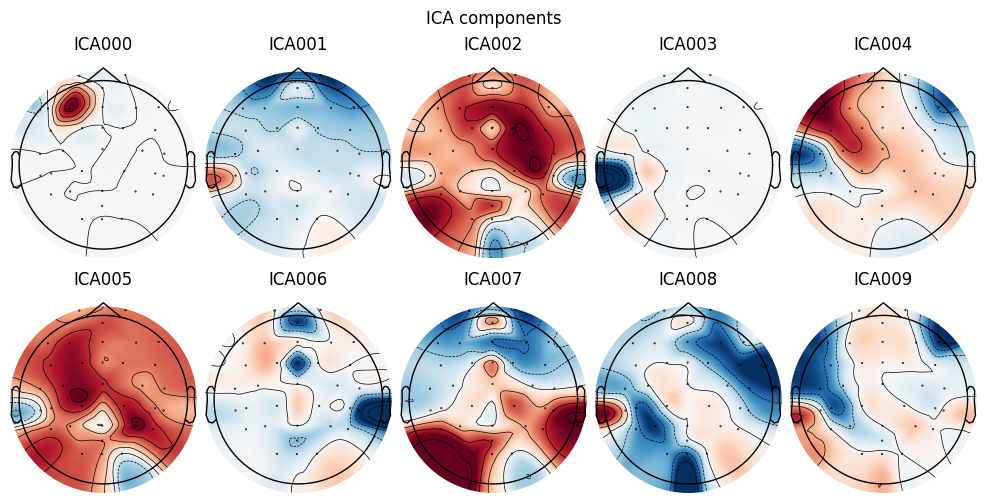

In [48]:
from sklearn.decomposition import KernelPCA
from sklearn.preprocessing import KernelCenterer

n_channels = data.shape[0]

# Kernel ICA Model
kernel_ica = KernelPCA(n_components=n_channels, kernel='rbf', random_state=0)
ica_components = kernel_ica.fit_transform(data.copy())

# Convert ICA components back to MNE object for plotting
ica_raw = mne.io.RawArray(ica_components.T, info)

# Plot ICA components as scalp topographies
ica = mne.preprocessing.ICA(n_components=10)
ica.fit(raw.copy())
ica.components_ = ica_components.T  # Manually set algorithm components

# Plot topomap of the ICA components
ica.plot_components(inst=ica_raw, show=True)


## **Target Versus Non-Target dataset**:

25 subjects testing Brain Invaders, a visual P300 Brain-Computer Interface using oddball paradigm. 16-electrodes, wet.

>[Dataset](https://zenodo.org/records/2649069) <br>
[GitHub](https://github.com/plcrodrigues/py.BI.EEG.2012-GIPSA) <br>
[Publication](https://hal.archives-ouvertes.fr/hal-02126068)

In [ ]:
!wget https://zenodo.org/records/2649069/files/subject_01.zip?download=1
!mv /content/subject_01.zip\?download\=1 /content/subject_01.zip
!unzip /content/subject_01.zip

--2024-09-20 20:36:33--  https://zenodo.org/records/2649069/files/subject_01.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.184.98.238, 188.185.79.172, 188.184.103.159, ...
Connecting to zenodo.org (zenodo.org)|188.184.98.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28717662 (27M) [application/octet-stream]
Saving to: ‘subject_01.zip?download=1’

subject_01.zip?down 100%[===================>]  27.39M  15.5MB/s    in 1.8s    

2024-09-20 20:36:35 (15.5 MB/s) - ‘subject_01.zip?download=1’ saved [28717662/28717662]

Archive:  /content/subject_01.zip
   creating: subject_01/
  inflating: subject_01/online.csv   
   creating: __MACOSX/
   creating: __MACOSX/subject_01/
  inflating: __MACOSX/subject_01/._online.csv  
  inflating: subject_01/online.mat   
  inflating: __MACOSX/subject_01/._online.mat  
  inflating: subject_01/training.csv  
  inflating: __MACOSX/subject_01/._training.csv  
  inflating: subject_01/training.mat  
  inflating: __MACOSX/s

In [ ]:
import mne
import matplotlib.pyplot as plt
from scipy.io import loadmat
from mne import create_info
from mne.io import RawArray


# Load data from .mat file
mat = loadmat('/content/subject_01/training.mat')

# Check the available keys (variables) inside the .mat file
print(mat.keys())

data = mat['training'] # Assuming the key for EEG data is 'data'

# Check data shape it should be: -->: (n_channels, time) if it' reveresed:
# First 700 data got a lot of noise
data = data.T[:18, 700:]

# If you got unusual plot you have to change data scalde and frequency
# Convert the data to volts by applying the appropriate scaling factor if the data is in microvolts:
data = data * 1e-6

# Create MNE info structure
sfreq = 128
ch_num = data.shape[0]

# mentioned in article, 'Fz' in ground
ch_names = ['F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4',
           'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2', 'STI 014']

ch_types = ['eeg'] * 17 + ['stim']

# Add montage (sensor positions)
montage = mne.channels.make_standard_montage('standard_1020')

info = create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)
info.set_montage(montage, on_missing='ignore')
raw = RawArray(data, info)

# Plot the data
# mne.viz.set_browser_backend('matplotlib')
# raw.plot(n_channels=ch_num)

dict_keys(['__header__', '__version__', '__globals__', 'training'])
Creating RawArray with float64 data, n_channels=18, n_times=46104
    Range : 0 ... 46103 =      0.000 ...   360.180 secs
Ready.


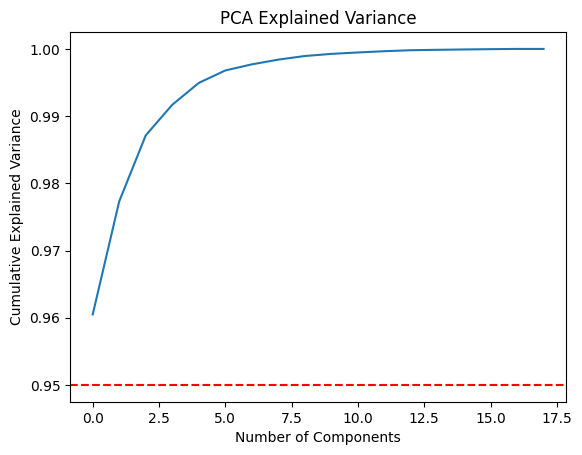

In [ ]:
from sklearn.decomposition import PCA
import numpy as np

pca = PCA(n_components=ch_num)  # Adjust the number of components
pca.fit(data)
explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
plt.plot(explained_variance_ratio)
plt.axhline(y=0.95, color='r', linestyle='--')  # Mark the 95% threshold
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.show()

In [ ]:
# Then we fit them like scikit learn
# If you want to filter data between frequency use: raw.copy().filter(450, 550)
# First we instantiate ICA
ica = mne.preprocessing.ICA(n_components=16, random_state=0, max_iter=800)
ica.fit(raw.copy())

Fitting ICA to data using 17 channels (please be patient, this may take a while)
Selecting by number: 16 components


<ipython-input-23-565b0d98669f>:5: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw.copy())


Fitting ICA took 3.9s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=800
Fit,37 iterations on raw data (46104 samples)
ICA components,16
Available PCA components,17
Channel types,eeg
ICA components marked for exclusion,—


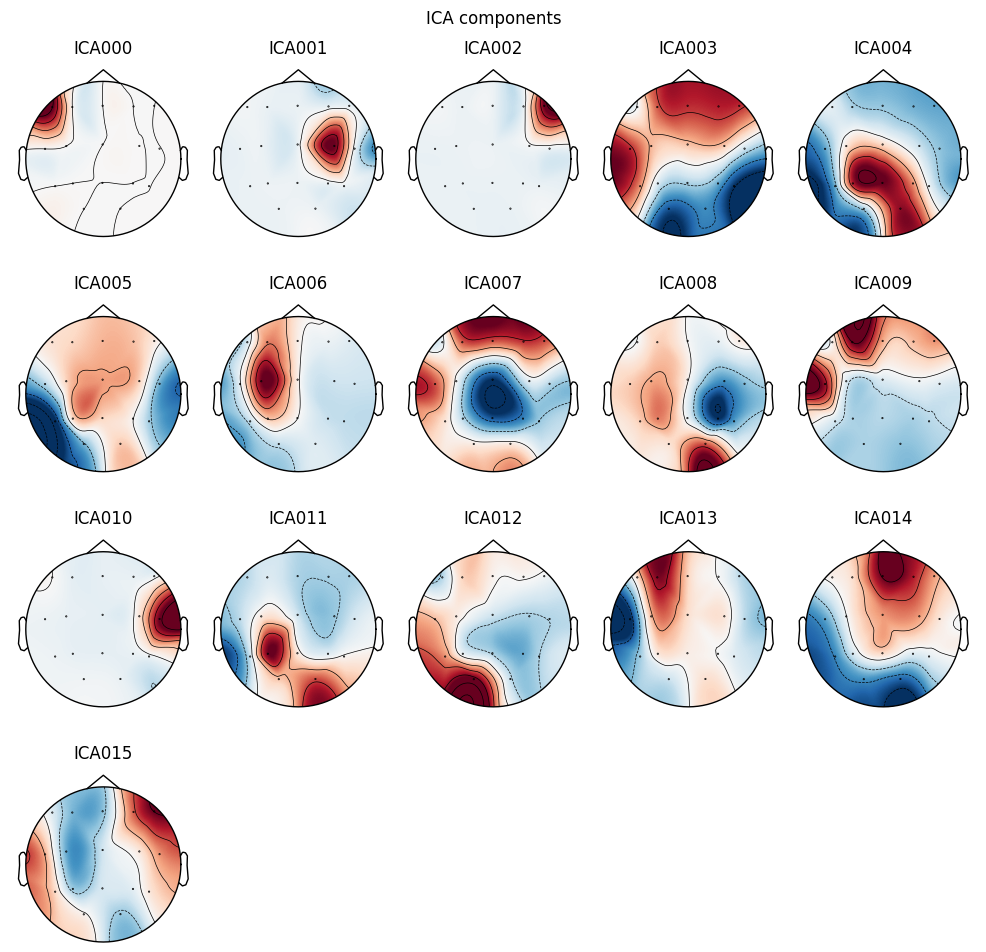

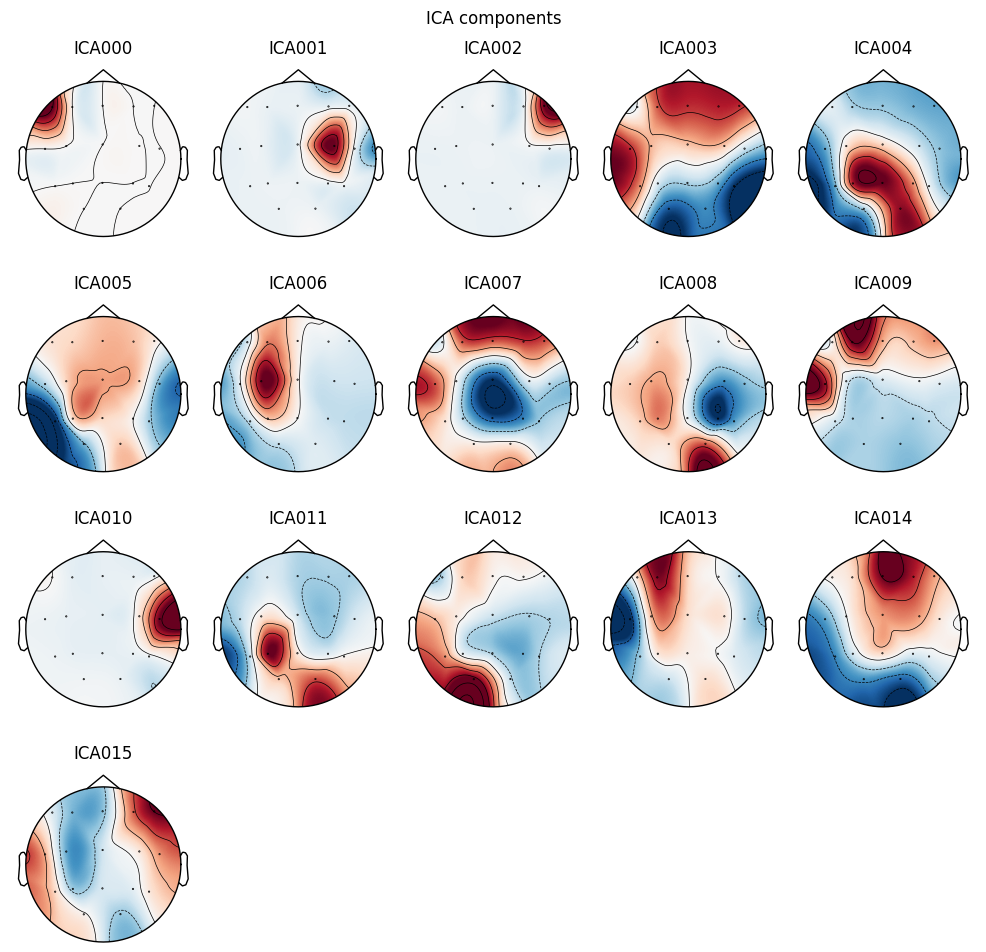

In [ ]:
ica.plot_components()

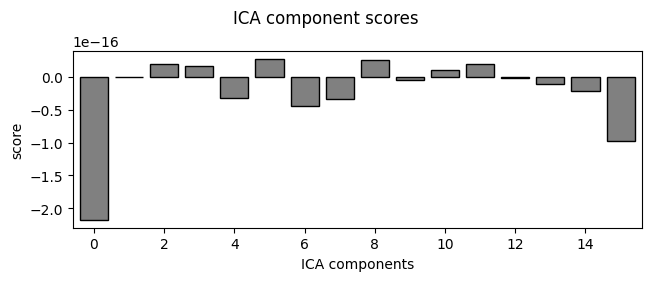

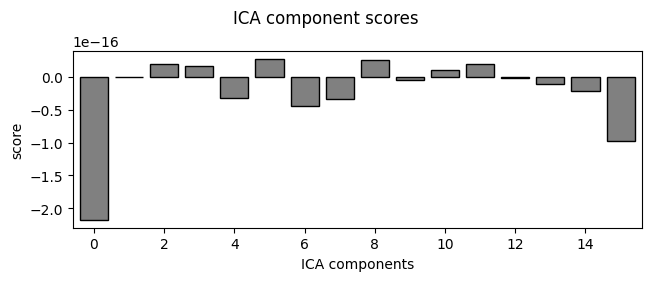

In [ ]:
scores = ica.get_sources(raw).get_data().mean(axis=1) # Calculate the mean score for each component across time.
ica.plot_scores(scores=scores)

In [ ]:
ica.exclude = [0, 2, 4, 5, 6, 7, 8, 15]
bad_idx, scores = ica.find_bads_ecg(raw, 'Fz', threshold=2)

print('-' * 30)
print(bad_idx)

Using channel Fz to identify heart beats.
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 1280 samples (10.000 s)

Number of ECG events detected : 488 (average pulse 81.29099427381573 / min.)
Not setting metadata
488 matching events found
No baseline correction applied
Using data from preloaded Raw for 488 events and 129 original time points ...
1 bad epochs dropped
------------------------------
[]


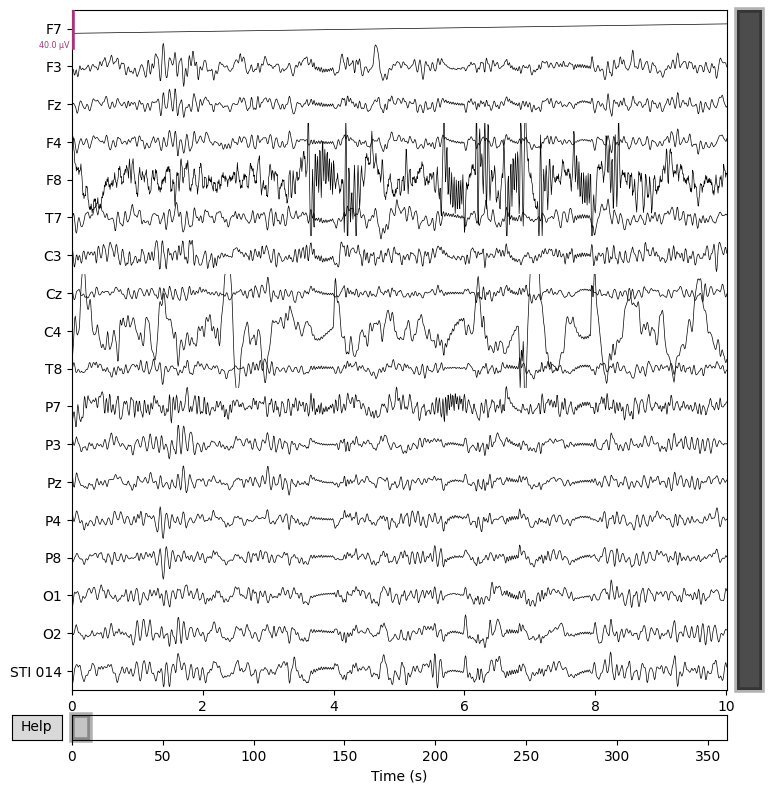

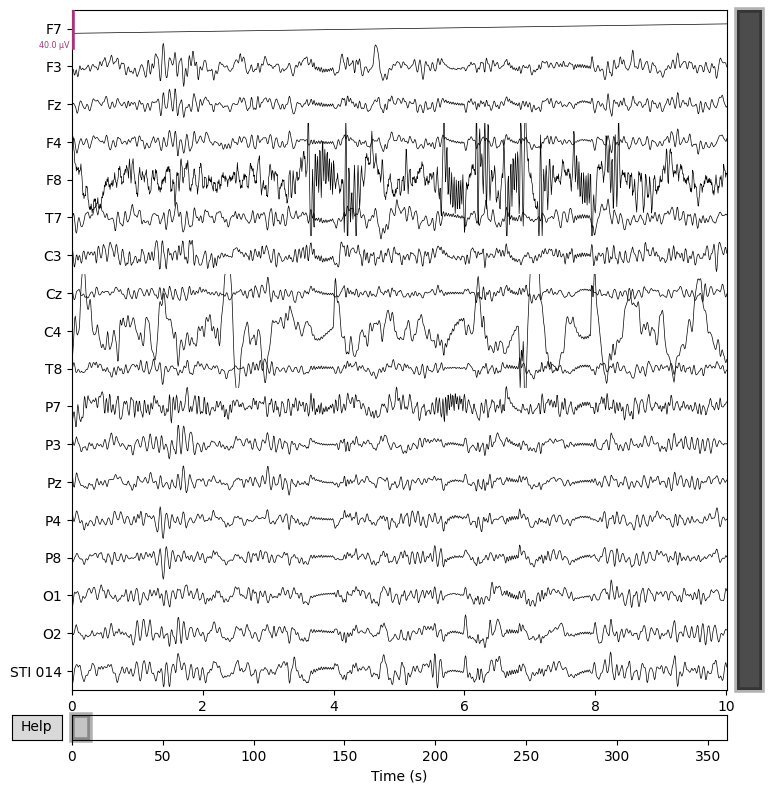

In [ ]:
raw.plot()

Applying ICA to Raw instance
    Transforming to ICA space (16 components)
    Zeroing out 8 ICA components
    Projecting back using 17 PCA components


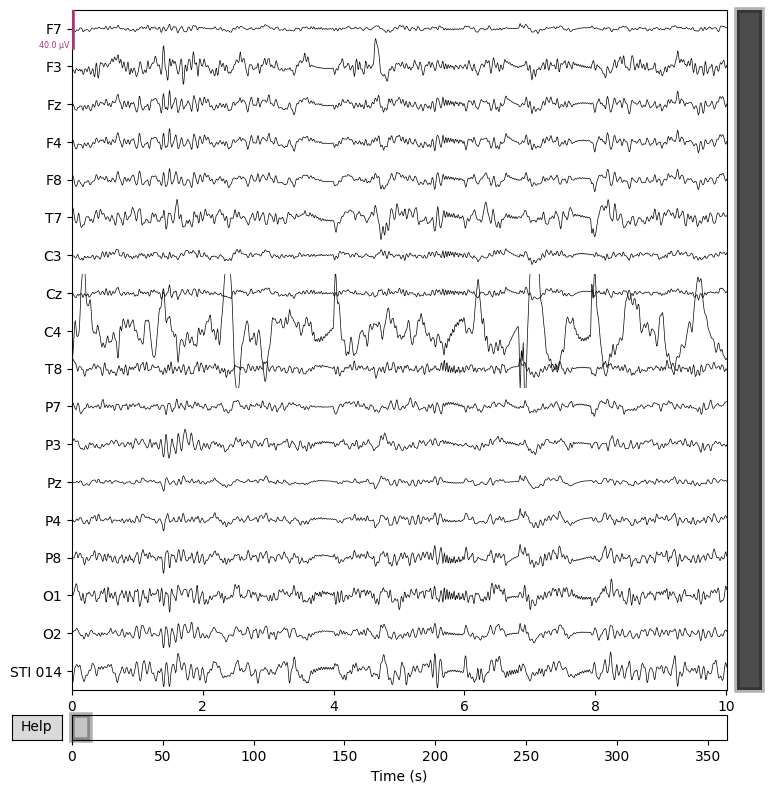

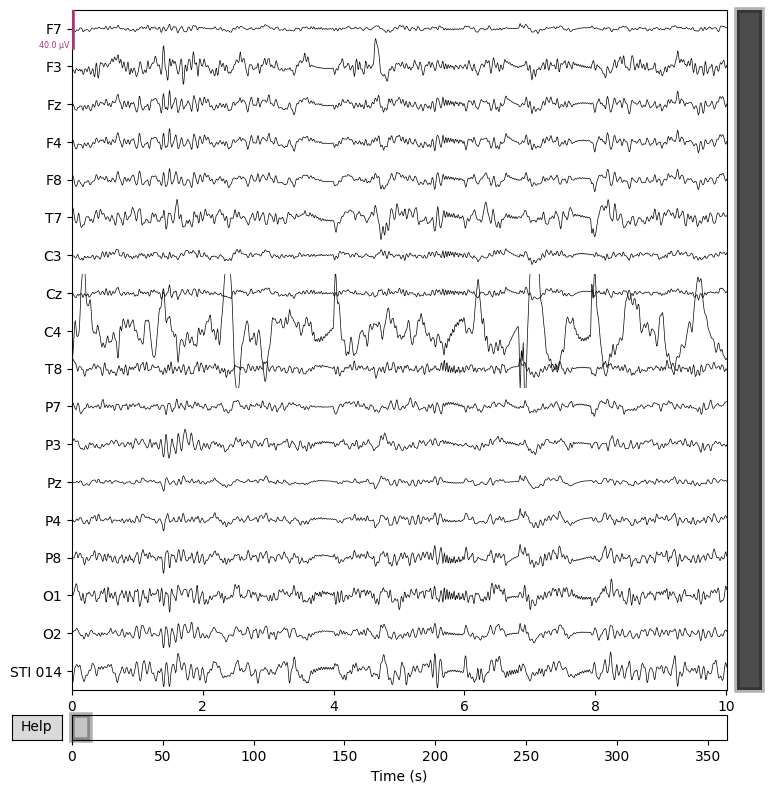

In [ ]:
ica.apply(raw.copy(), exclude=ica.exclude).plot()